## Intermediate Data Science

#### University of Redlands - DATA 201
#### Jesus Plascencia 
#### Purpose: To practice identifying which model fits the data best. 

In [3]:
# Some basic package imports
import os
import numpy as np
import pandas as pd

# Visualization packages
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.io as pio
pio.renderers.defaule = 'colab'
import seaborn as sns

# ML packages
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor

from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score 
from sklearn.metrics import confusion_matrix, classification_report

---------------
## Knn vs Linear Models - Day14 HW

We are going to do an analysis of life expectancy data:

[https://www.kaggle.com/datasets/kumarajarshi/life-expectancy-who](https://www.kaggle.com/datasets/kumarajarshi/life-expectancy-who)

Your goal is to do a full analysis of this data. You should start with a description of the data and a full Exploratory Data Analysis! 
- Do some basic statistics and value counts. Is the data balanced? Is it timeseries data? Should you analyze the years separately or all together?
- Use seaborn to plot the data and choose your features. You should consider if some features have more of a polynomial shape. Get to know the data! Discuss what parts of the data are going to be important in choosing your model.
- For the features that you choose, clean up the data: remove false zeros, remove NAN's, and if possible remove outliers. For each action that you take describe your logic, why is this a good idea?
- Choose a model: Linear Regression, KNN, Logistic Regression, Polynomial Features.

After you have picked a model you should Train and Test your model!
- Make sure to compare the model metrics for BOTH the training and the testing sets. For classification you will want to compare accuracy/precision/recall and for regression you will want to compare MSE/R^2.
- What variables seem to be the strongest predictors for life expectancy?
- What models did you try and why did you decide which was best?


Please write up your conclusions.

**Your final notebooks should:**

- [ ] Be a completely new notebook with just the Day14 stuff in it NO YOU TRY: Read in the data, make the plots. Make sure to discuss what you see and comment on why your plots are great!
- [ ] **Contain your "best model(s)" ALONG WITH a discussion of what other things you tried and why these are your best results.**
- [ ] Be reproducible with junk code removed.
- [ ] Have lots of language describing what you are doing, especially for questions you are asking or things that you find interesting about the data. Use complete sentences, nice headings, and good markdown formatting: https://www.markdownguide.org/cheat-sheet/
- [ ] It should run without errors from start to finish.

In [5]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("kumarajarshi/life-expectancy-who")

print("Path to dataset files:", path)

file = path + '/' + os.listdir(path)[0]
df = pd.read_csv(file)

Path to dataset files: /Users/jesusplascencia/.cache/kagglehub/datasets/kumarajarshi/life-expectancy-who/versions/1


### 1] Do some basic statistics and value counts. Is the data balanced? Is it timeseries data? Should you analyze the years separately or all together?
When looking at the describe() function no mean value seems to be out of the ordinary. Min and max values are also not concerning for Life Expectacny, and other variables. When looking at the datatypes, everything seems to be correctly speficied. Categorical data such as country, status are objects, while the rest of the data is either a integer or a float. We have 2938 observations with 22 columns of data spanning from 2000 to 2015 for all countries. This data has no author or licenses and is not frequently updated.

Our data is not initially balanced. We have 10 NaN values in life expectacy which must be addressed. We cannot train a KNN regressor because we need to deal with the NaN values. To do this, I analyzed key variables visually, and decided which Features were most important to the model. I did not want to simply drop NaN values, but I found it necessary when looking at the Life Expectancy data. There were only 10 NaN values and it was not significant enough to Warrant concerns. Additionally, lots of the features we could use overlap with one another. For example, Infant deaths which has no NaN values can be a proxy used for different sickness infants may get. Another example, because we know the expenditure on health has no NaN values, it could also be used as a proxy for GDP, schooling, and total expendiutre. This is because we expect these variables to be highly correlated, meaning, an increase in health expenditures could be due to improving macroeconomic conditions (GDP) or due to more schooling, or because an overall increase in expenditures. 

It is difficult to determine if this data is timeseries or panel data. We do have a year component but for mnay countries at once. This is a classic description of panel data. This is panel data becaue we follow multiple countries overtime as opposed to just one country. We want to see how life expectancy changes over time. We should analyze the years together because we gain far more insight doing so. We would be able to analyze and identify trends, patterns, or even unexpected outliers.

In [7]:
df.shape

(2938, 22)

In [8]:
df.head(5)

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [15]:
df.describe()

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
count,2938.000000,2928.000000,2928.000000,2938.000000,2744.000000,2938.000000,2385.000000,2938.000000,2904.000000,2938.000000,2919.000000,2712.00000,2919.000000,2938.000000,2490.000000,2.286000e+03,2904.000000,2904.000000,2771.000000,2775.000000
mean,2007.518720,69.224932,164.796448,30.303948,4.602861,738.251295,80.940461,2419.592240,38.321247,42.035739,82.550188,5.93819,82.324084,1.742103,7483.158469,1.275338e+07,4.839704,4.870317,0.627551,11.992793
std,4.613841,9.523867,124.292079,117.926501,4.052413,1987.914858,25.070016,11467.272489,20.044034,160.445548,23.428046,2.49832,23.716912,5.077785,14270.169342,6.101210e+07,4.420195,4.508882,0.210904,3.358920
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.37000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,2004.000000,63.100000,74.000000,0.000000,0.877500,4.685343,77.000000,0.000000,19.300000,0.000000,78.000000,4.26000,78.000000,0.100000,463.935626,1.957932e+05,1.600000,1.500000,0.493000,10.100000
50%,2008.000000,72.100000,144.000000,3.000000,3.755000,64.912906,92.000000,17.000000,43.500000,4.000000,93.000000,5.75500,93.000000,0.100000,1766.947595,1.386542e+06,3.300000,3.300000,0.677000,12.300000
75%,2012.000000,75.700000,228.000000,22.000000,7.702500,441.534144,97.000000,360.250000,56.200000,28.000000,97.000000,7.49250,97.000000,0.800000,5910.806335,7.420359e+06,7.200000,7.200000,0.779000,14.300000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.60000,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000


In [17]:
#For Balance of data, in this case it means removing NaN values. Life expectancy has 10 NaN so does more of our key variables.
df.isna().sum() 

Country                              0
Year                                 0
Status                               0
Life expectancy                     10
Adult Mortality                     10
infant deaths                        0
Alcohol                            194
percentage expenditure               0
Hepatitis B                        553
Measles                              0
 BMI                                34
under-five deaths                    0
Polio                               19
Total expenditure                  226
Diphtheria                          19
 HIV/AIDS                            0
GDP                                448
Population                         652
 thinness  1-19 years               34
 thinness 5-9 years                 34
Income composition of resources    167
Schooling                          163
dtype: int64

In [19]:
#Theirs so many variables with random spaces, I used the janitor function to make my life a bit easier
import janitor
df = df.clean_names()
print(list(df.columns))

['country', 'year', 'status', 'life_expectancy_', 'adult_mortality', 'infant_deaths', 'alcohol', 'percentage_expenditure', 'hepatitis_b', 'measles_', '_bmi_', 'under_five_deaths_', 'polio', 'total_expenditure', 'diphtheria_', '_hiv_aids', 'gdp', 'population', '_thinness_1_19_years', '_thinness_5_9_years', 'income_composition_of_resources', 'schooling']


In [45]:
x_col_no_nan = [
       'infant_deaths', 'percentage_expenditure',
       'measles_', 'under_five_deaths_', '_hiv_aids']

x_col_with_nan = [
    'adult_mortality', 'alcohol', 'hepatitis_b', '_bmi_', 'polio', 'total_expenditure', 'diphtheria_', 'gdp', 'population' 
    ,'_thinness_1_19_years', '_thinness_5_9_years', 'income_composition_of_resources', 'schooling'
]


In [47]:
#Dropping the NaN for our key variable
df_new = df[df['life_expectancy_'].notna()]
sum(df_new['life_expectancy_'].isna())

0

In [49]:
df_new = df[df['adult_mortality'].notna()]
sum(df_new['adult_mortality'].isna())

0

In [51]:
#Counting the NaN's for this model to make sure we have 0
for col in x_col_no_nan:
    print(col)
    print(sum(df[col].isna()))

infant_deaths
0
percentage_expenditure
0
measles_
0
under_five_deaths_
0
_hiv_aids
0


### 2] Use seaborn to plot the data and choose your features. You should consider if some features have more of a polynomial shape. Get to know the data! Discuss what parts of the data are going to be important in choosing your model 

As I mentioned earlier, the x columns without NaN values should suffice to make a great model. We base this decision on simplicity, and more specifically, because our variables are indicative of life expectancy. To know which parts of the data are important in choosing my model we have already identified an important point. We know we have a limitation in our data due to NaN values and we want to ensure we are using columns in which we dont have to drop NaN, interpolate, or fill in values. Another key way to identify key variables is by looking at the SeaBorn graphs, or by looking at the visuals we created using our X values with NaN and our X values without NaN and their relationship with Life expectancy. The following variables seemed to move reandomly without patterns so it may be safe to exclude them from our model: thinness 5-9/1-19 years, population, diphtheria, total expenditure, polio, BMI, Measels, Hepatitis b, and alcohol. The variables that did show some relationship with life_expectancy were schooling, income composiiton, gdp, hiv, under five deaths, percentage expenditure, adult mortality. Out of these key variables we identified, we have percentage expenditure which serves as a good proxy for gdp, under five deaths, and hiv. I thought Infant deaths may  serve as a good proxy for adult mortality but I was incorrect. They are very weakly positively correlated. I decided to just drop the 10 NaN values on Adult mortality because it was a small amount of NaN, and adult mortality was a very important feature for our model. 

Infant Deaths seems to be linear but it is very confusing to know looking at it visually. Percentage expenditures, adult mortality, and Hiv/Aids all have one curve. Under five deaths and infant deaths are identical visually, so we may choose to just use infant deaths. Measels seems to have no trend or relationship with life expectancy but we will include it in our model to see if it improves the accuracy score. I would have loved to use income composition and schooling in our model because they look important in answering our question; however, I am concerned with the amount of NaN values I see. Both have above 160 NaN values and that is approximately 8% of our data missing. I do not want to interpolate or flash fill because that would falsify our data if there is no good reason to do so. I also do not want to drop 8% of our data so I find it best to just exclude these features. 

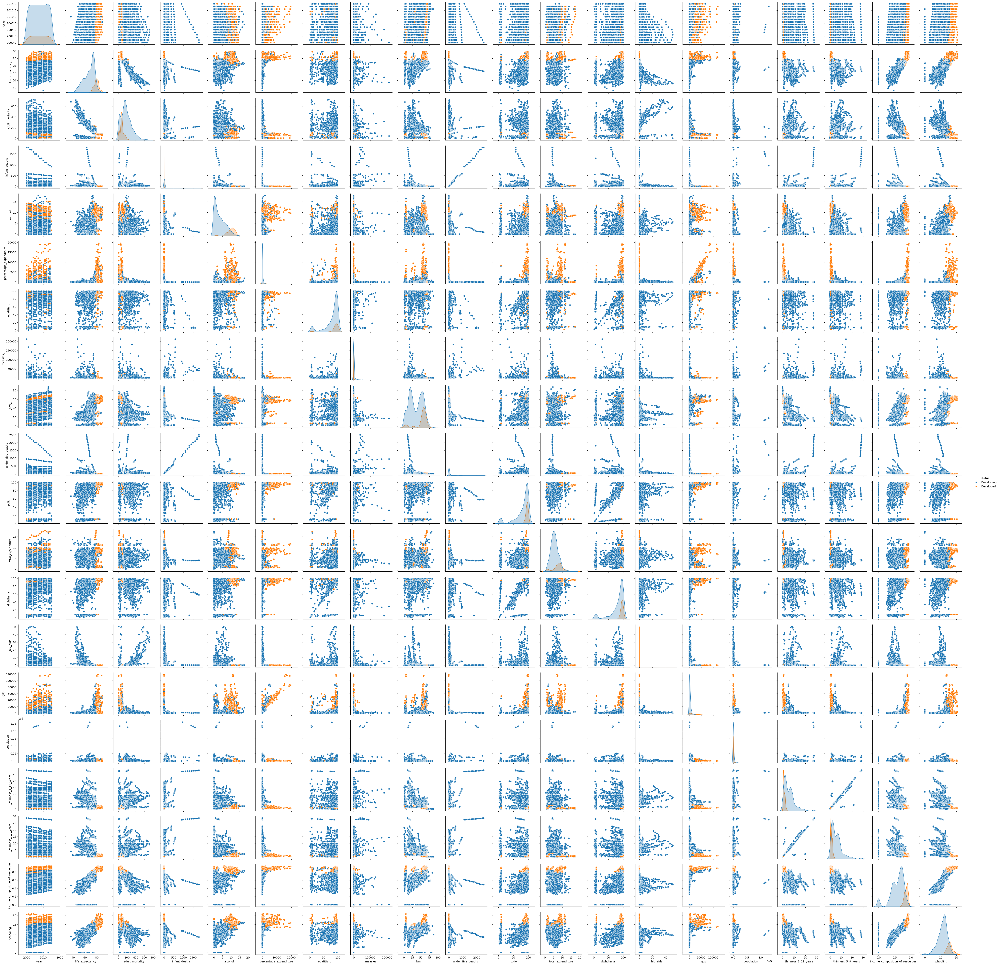

In [83]:
sns.pairplot(df,hue='status')

In [53]:
# Visualization: We chose the features without NaN's
x_col = [
       'infant_deaths', 'percentage_expenditure',
       'measles_', 'under_five_deaths_', '_hiv_aids', 'adult_mortality']

y_col = ['life_expectancy_']

X = df_new[x_col]
y = df_new[y_col]

In [55]:
#This quickly shows how some features are correlated with other features. 
#df[['percentage_expenditure', 'gdp']].corr()
#df[['infant_deaths', 'adult_mortality']].corr()
#df[['percentage_expenditure', '_bmi_']].corr()

infant_deaths


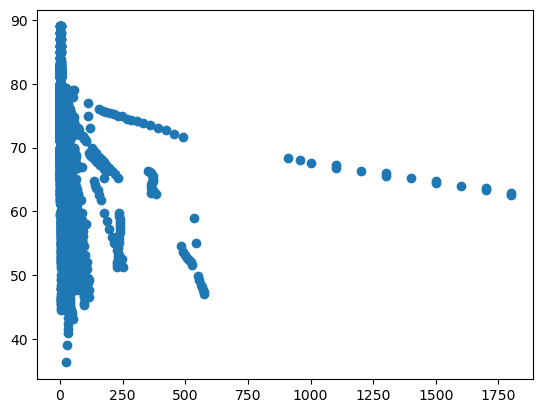

percentage_expenditure


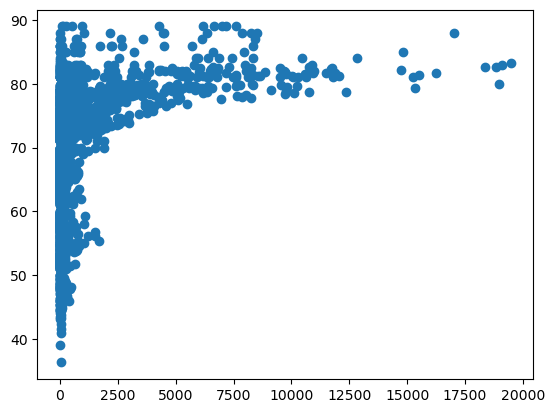

measles_


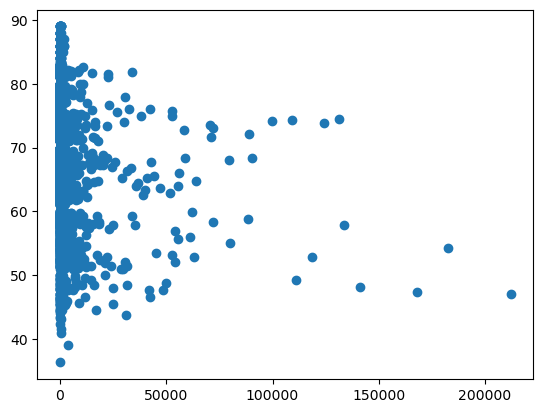

under_five_deaths_


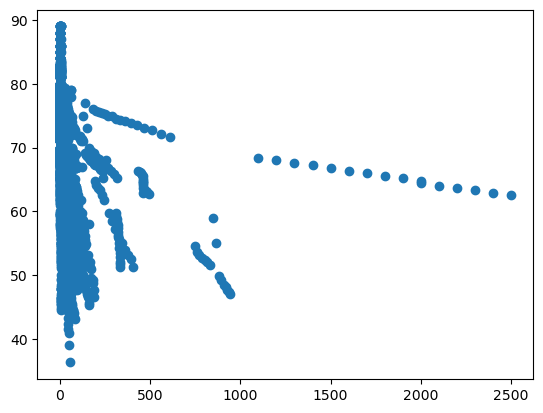

_hiv_aids


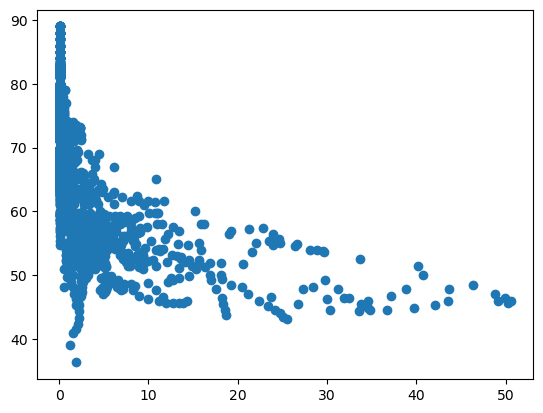

adult_mortality


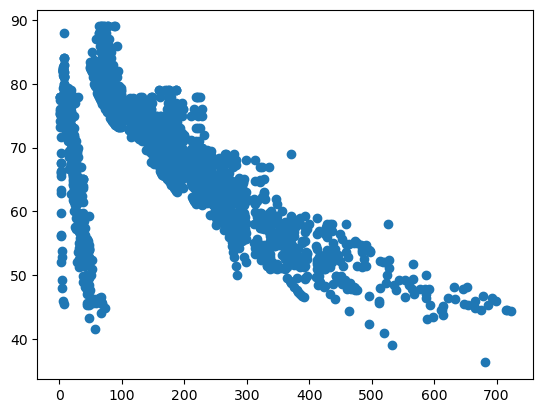

In [57]:
#no NaN
for col in x_col:
    print(col)
    plt.scatter(df[col], df[y_col])
    plt.show()

adult_mortality


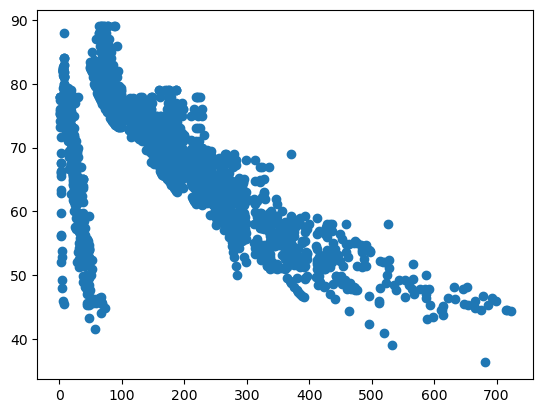

alcohol


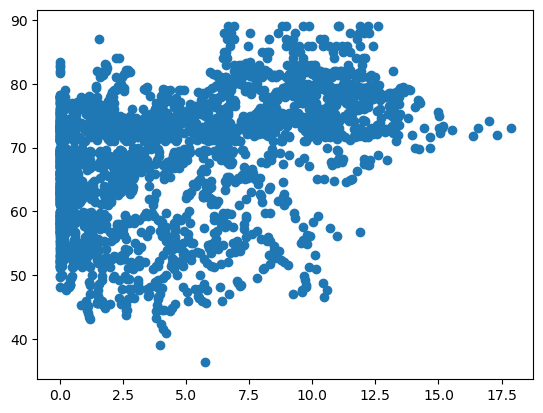

hepatitis_b


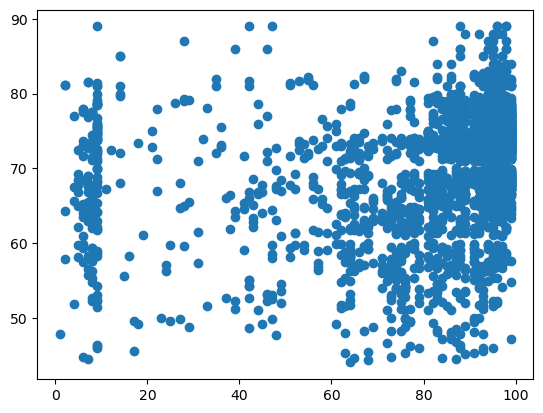

_bmi_


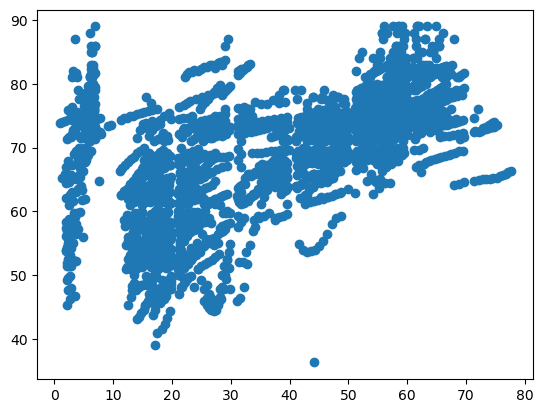

polio


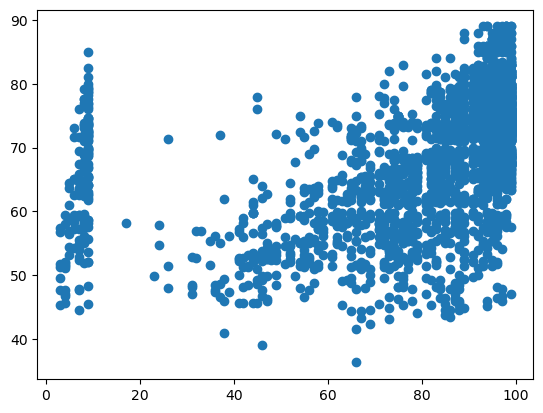

total_expenditure


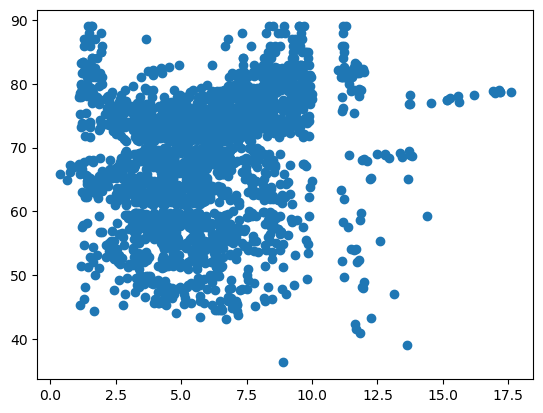

diphtheria_


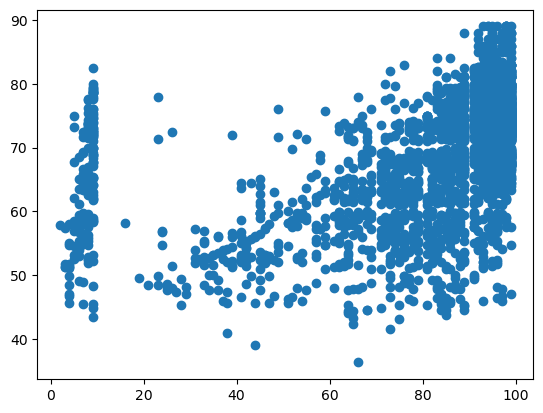

gdp


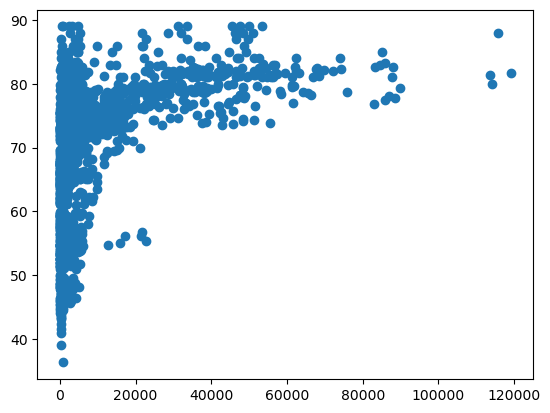

population


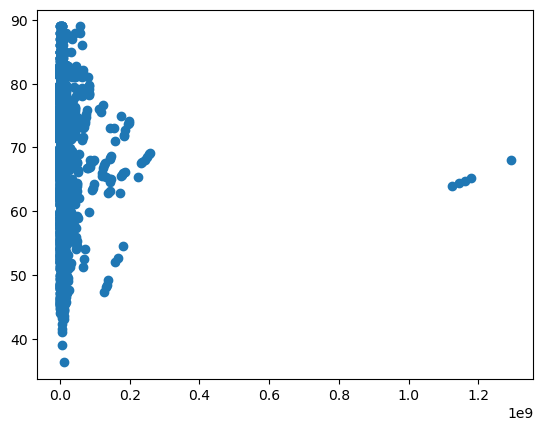

_thinness_1_19_years


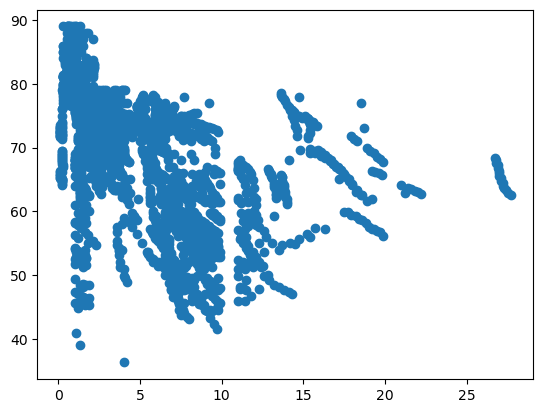

_thinness_5_9_years


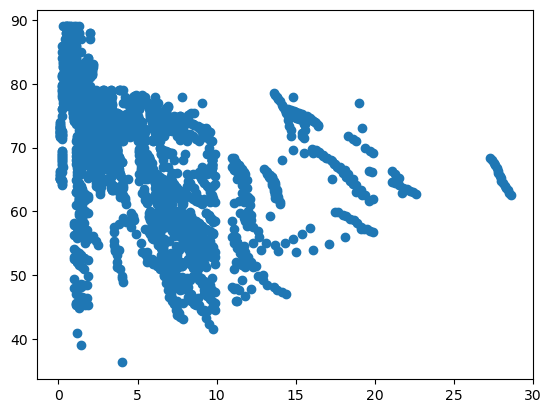

income_composition_of_resources


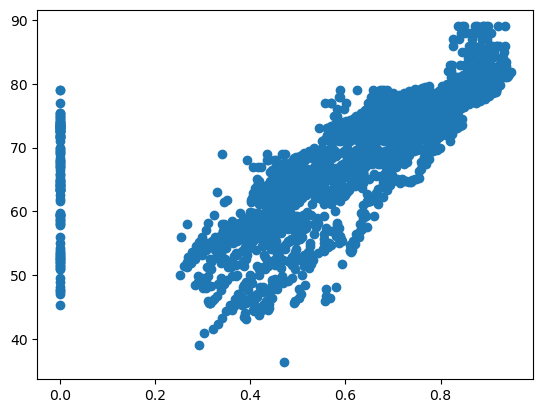

schooling


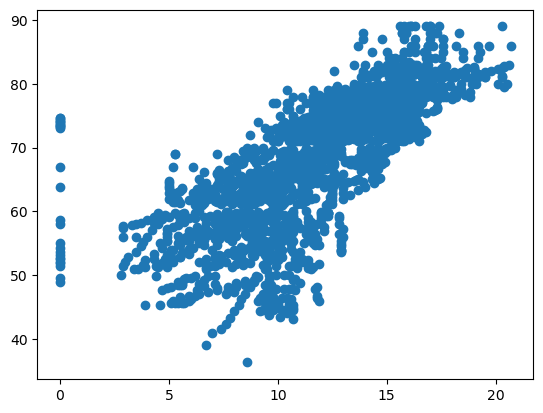

In [59]:
#NaN values
for colx in x_col_with_nan:
    print(colx)
    plt.scatter(df[colx], df[y_col])
    plt.show()

### 3) For the features that you choose, clean up the data: remove false zeros, remove NAN's, and if possible remove outliers. For each action that you take describe your logic, why is this a good idea?

For this question I feel as if I answered it with my responses in the earlier questions.  

### 4) Choose a model: Linear Regression, KNN, Logistic Regression, Polynomial Features. Which Feature is strongest, and Which model did you choose? 

I want to model life expectancy based on infant deaths, percentage expenditure, measels, hiv/aids, and adult mortality. Life exectancy is an integer value so logisitic regression would not work. KNN and KNN Regression would not be ideal because I find it difficult to conceptualize how KNN would function without key distinctions in my data between varying levels of life expectancies. For this reason, I find a linear regression to be the best but only if we account for the polynomial relationships we see visually with Percentage expenditures, adult mortality, and Hiv/Aids. To confirm my claims I will do a KNN regression and a linear regression then specify degrees to find the best model.

After modeling, these are my results. The KNN Regression produced a MSE and R squared error of 32.7 anad 0.64. That means that 64% of the variation in life expectacny is explained by our X features. This is the best result we can get using our features because we used 7 neighbors which is the ideal number of K values we should have. The hyperparameter tuning steps are found below. A linear Regression model gives us a MSE of 33.123, and a R^2 of 0.641. our godness of fit is very similar to that of the KNN regressor but we get a slightly better MSE. So given this, we find the linear regression to be a slightly better model for our question. I wanted to adjust for the curves we saw in specific features so I used a polynomial regression and found that we may be overfitting by adjusting for the curves we see. This is because my MSE decreased to 30.86, while my goodness of fit increased to 0.665. Overall, it seems as if the linear regression is the best choice of model to gain insight on life expectancy. Note, I find features that have a clear visual correlation with life expectancy to be the strongest features to use. I wanted to create a summary table of the linear regression model we ran, but was having trouble finding a package to do so. Im R programming, I know its as simple as doing model.summary(), but Im wondering if theirs something similar for Python. 

In [63]:
# KNN Regression
x_col = [
       'infant_deaths', 'percentage_expenditure',
       'measles_', 'under_five_deaths_', '_hiv_aids', 'adult_mortality']

y_col = ['life_expectancy_']

X = df_new[x_col]
y = df_new[y_col]

In [65]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=.2, random_state= 16) #Only trains 20% of the data 

In [67]:
model = KNeighborsRegressor(n_neighbors=7) #plugging in k values

In [69]:
model.fit(X_train, y_train) # Fit the model to your current data --> We had NaN's so we had to handle that first

,n_neighbors,7
,weights,'uniform'
,algorithm,'auto'
,leaf_size,30
,p,2
,metric,'minkowski'
,metric_params,None
,n_jobs,None


In [71]:
y_pred = model.predict(X_test)
MSE = mean_squared_error(y_test, y_pred)
print(f'MSE:{MSE}')
Rsq = r2_score(y_test, y_pred)
print(f'Rsq:{Rsq}')



MSE:32.70068793714669
Rsq:0.6455560225669816


In [73]:
#Linear Regression, Training my model
linreg = LinearRegression()
linreg.fit(X_train, y_train)

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [75]:
# Getting a score 
pred = linreg.predict(X_test)
mse = mean_squared_error(y_test, pred)
r2 = r2_score(y_test, pred)
print(f"MSE on test set: {mse:.3f}")
print(f"R² on test set: {r2:.3f}")

MSE on test set: 33.123
R² on test set: 0.641


In [77]:
#Polynomial Regression 
# Choose a second degree polynomial
degree = 2

# Transform the x variables to be both x and x^2
poly = PolynomialFeatures(degree=degree, include_bias=False)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

linreg = LinearRegression()
linreg.fit(X_train_poly, y_train)


,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [79]:
y_pred = linreg.predict(X_test_poly)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"MSE on test set: {mse:.3f}")
print(f"R² on test set: {r2:.3f}")

MSE on test set: 30.862
R² on test set: 0.665


# Hyperparameter tuning = how many neighbors should I have. 
## How did I do this 
### 1) Plot training and testing accuracy
#### To do this, Choose a range of testing hyperparameters, For example choose a range of n=1 to n=10 neighbors, rerun the model using a for loop and collect accuracy numbers for your your model at the new K values. I found anything after 7 neighbors to be overfitting. 

In [82]:
# Testing 
MSEs_train = []
Rsrd_train = []
MSEs_test = []
Rsqrd_test = []

for k in [2,3,4,5,6,7,8,9,10]:
    model = KNeighborsRegressor(n_neighbors=k)
    model.fit(X_train,y_train)

    #Train
    y_pred = model.predict(X_train)
    MSEs_train.append(mean_squared_error(y_train,y_pred))
    Rsrd_train.append(r2_score(y_train, y_pred))
    
    #Test
    y_pred = model.predict(X_test)
    MSEs_test.append(mean_squared_error(y_test,y_pred))
    Rsqrd_test.append(r2_score(y_test, y_pred))

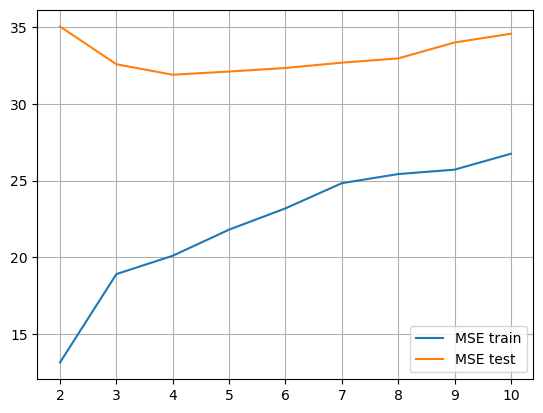

In [84]:
kvals = [2,3,4,5,6,7,8,9,10]
plt.plot(kvals, MSEs_train, label = 'MSE train')
plt.plot(kvals, MSEs_test, label = 'MSE test')
# plt.plot(kvals, Rsrd_train, label = 'R^2 train')
# plt.plot(kvals, Rsqrd_test, label = 'R^2 test')

plt.grid()
plt.legend()
plt.show()

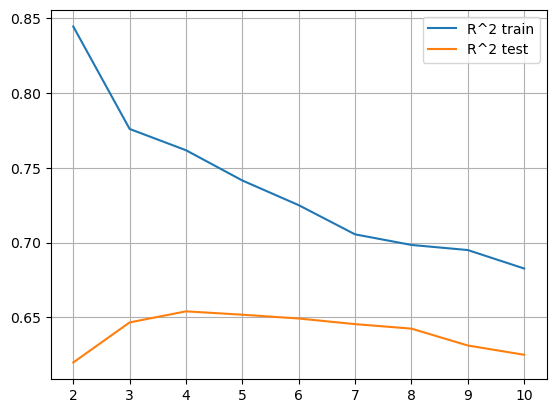

In [86]:
#7 is the best R^2 because after 7 you are overfitting
plt.plot(kvals, Rsrd_train, label = 'R^2 train')
plt.plot(kvals, Rsqrd_test, label = 'R^2 test')

plt.grid()
plt.legend()
plt.show()